# Original Full Model

In [5]:
print('hello')

hello


In [6]:
import sys
sys.path.insert(0, '../../OSSWEM_helpers')
# sys.path.insert(0, '..')

import matplotlib.pyplot as plt
import numpy as np
from OSSWEM_obc_orlanski import SSWEM                 # 1D Orlanski scheme (r_x only)
from OSSWEM_obc_orlanski_2D import SSWEM as SSWEM_2D  # [1D-2D] 2D oblique Orlanski (adds r_y)

mesh: ni = 120  nj = 180
Grid: dx = 10000.0 [m]  dy = 10000.0 [m]
cg = 8.0 [m s-1]
Ld = 80000.0 [m]
Scales: Ls=epsilon/D/beta = 1041.6666666666667 [m]
Scales: Lx/Ld = 15.0
Res: Ld/dx = 8.0
Res: Ls/dx = 0.10416666666666667


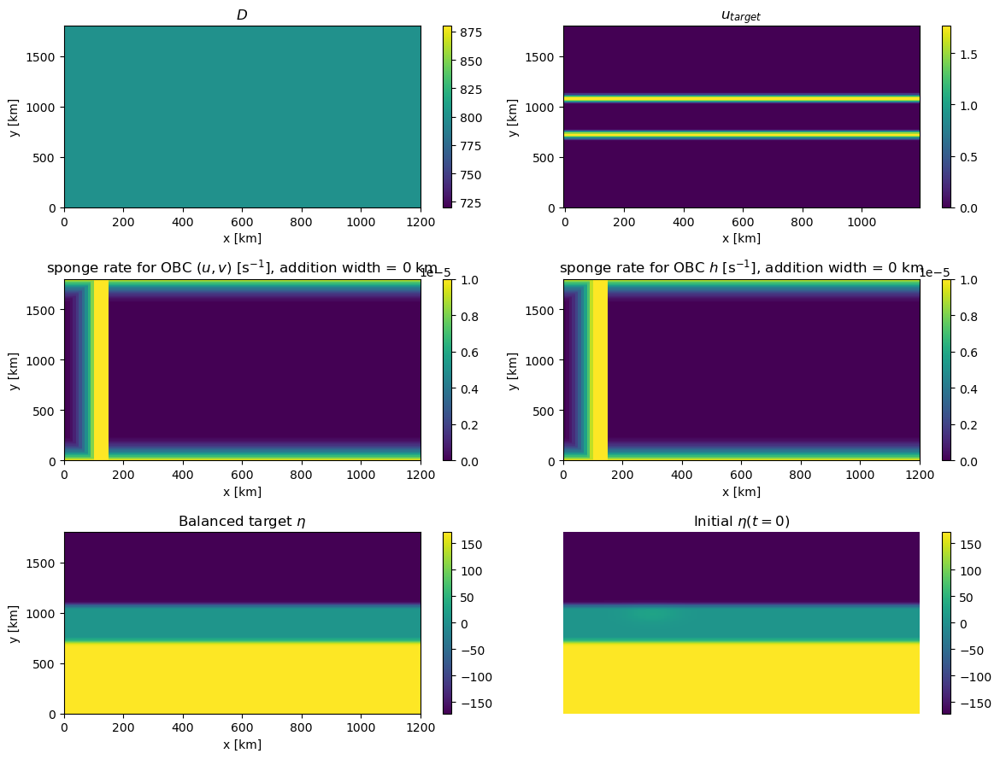

In [7]:
# Barotropic instability in a channel: a balanced zonal jet maintained by a
# localized western sponge (beta-plane).

# nj, ru_params = [dt, steps/segment, segments]
# nj, run_params = 40, [200., 500, 25]  # Barely permitted eddies
nj, run_params = 180, [200., 500, 100]  # Coarsest resolution with good instabilities
# nj, run_params = 120, [50., 2000, 100]  # Finer resolution
# nj, run_params = 180, [5., 5000, 100]  # Finer resolution is very unstable

M = SSWEM(2 * nj // 3,
          0.08,    # Gravity [m s-2]
          800.,    # Nominal layer thickness [m]
          1200.e3,  # Domain width [m]  (50% longer in x than y)
          1.e-4,   # Coriolis [s-1]
          3.0e-11, # df/dy [m-1 s-1]  (beta-plane arrests the large-scale meridional mode)
          2.5e-5,  # Bottom drag rate [m s-1]
          2e2,     # Lateral viscosity [m2 s-1]
          nj=nj    # Rectangular channel
          )
# M.D[0,:] = 0       # dry rows N/S -> zonal channel walls
# M.D[-1,:] = 0

# Single jet
# M.set_u_target_jet(1.0) 
# yc   = M.yu / M.Ly                                 
# hw   = 180e3 / M.Ly                               
# bump = lambda c: SSWEM._cubint(yc, c-hw, c) - SSWEM._cubint(yc, c, c+hw)
# profile = bump(1/2)                               
# M.u_target = np.empty_like(M.u)                    
# for k in range(M.nk):                            
#     M.u_target[k, :] = 2.5 * profile       
# yc   = M.yu / M.Ly                                 
# hw   = 100e3 / M.Ly                               
# bump = lambda c: SSWEM._cubint(yc, c-hw, c) - SSWEM._cubint(yc, c, c+hw)
# profile = bump(1/2)                               
# M.u_target = np.empty_like(M.u)                    
# for k in range(M.nk):                            
#     M.u_target[k, :] = 2.5 * profile         

# Double jet
yc = M.yu / M.Ly                                   # non-dim y at u-points
hw = 60e3 / M.Ly                                   # half-width of each jet (< Ly/6 so they don't overlap)
bump = lambda c: SSWEM._cubint(yc, c-hw, c) - SSWEM._cubint(yc, c, c+hw)
profile = 1.8 * (bump(2/5) + bump(3/5))                   # two eastward jets at y = 2Ly/5, 3Ly/5
M.u_target = np.empty_like(M.u)
for k in range(M.nk):
    M.u_target[k, :] = 1.0 * profile               # 1.0 = peak speed [m/s]


uy  = M.u_target[0].mean(axis=1)                   # u(y)
f_h = M.fo + M.beta * M.yh1                        # f(y) at row centres
eta = -(1.0/M.g[0]) * np.cumsum(f_h * uy) * M.dy
eta -= eta.mean() # Why remove mean? 
hbal = np.maximum(M.D + eta[:, None], 0.0)         # balanced thickness
hbal[0, :] = hbal[1, 1]
hbal[-1, :] = hbal[-2, 1]

# ============================= Sponge Layer Setup ==============================================

# Sponges restoring u->jet, v->0, h->balanced: a western sponge over the westernmost
# 150 km, plus N/S near-wall sponges over the outer 100 km.
# Local forcing only; the rest of the domain is free to evolve.
factor = 1.5
def ramp(x, x0, Lx, p=2): return np.clip((x - x0)/(Lx - x0), 0, 1)**p
def ramp2(x, x0, Lx, factor=1.5): return np.clip(factor*(x - x0)/(Lx - x0), 0, 1)**2
# rate, Lw, yb = 1.0e-5, 150.e3, 100e3               # western sponge width Lw; near-wall band yb
rate_h, rate_uv, Lw_uv, Lw_h, yb = 1.e-5, 1.e-5, 150.e3, 150.e3, 250e3

rate_h_ns = rate_h
rate_uv_ns = rate_uv

ratio_temp = 0
width = ratio_temp * Lw_uv
# width = 0.e3
# width = 50.e3 # The additional width of the sponge layer

# Western sponge: the eastern ramp shifted to [0, Lw + d] -- same W->E rise (0 at x=0 up to
# the max), then masked to 0 beyond Lw so it drops discontinuously to 0 at x=Lw + d

# Modified here, Lw + d
M.u_relax  = rate_uv * np.maximum( np.maximum( ramp2(M.xu, 0., Lw_uv) * (M.xu < Lw_uv + width), ramp(M.yu, M.Ly - yb, M.Ly) ), ramp(M.Ly - M.yu, M.Ly - yb, M.Ly) )
M.v_relax  = rate_uv * np.maximum( np.maximum( ramp2(M.xv, 0., Lw_uv) * (M.xv < Lw_uv + width), ramp(M.yv, M.Ly - yb, M.Ly) ), ramp(M.Ly - M.yv, M.Ly - yb, M.Ly) )
M.h_relax  = rate_h * np.maximum( np.maximum( ramp2(M.xh, 0., Lw_uv) * (M.xh < Lw_uv + width), ramp(M.yh, M.Ly - yb, M.Ly) ), ramp(M.Ly - M.yh, M.Ly - yb, M.Ly) )
M.h_target = hbal[None, :, :].copy()               # u_target/v_target already set (jet / 0)


#====================================== END ======================================================

# Balanced initial state everywhere + a small smooth perturbation to seed eddies
M.u[0] = M.u_target[0].copy()
M.h[0] = hbal.copy()
M.perturb_h(20., 0.05 * M.Lx, 3.e5, 0.55 * M.Ly)

# Setup diagnostics
fig, ax = plt.subplots(3, 2, figsize=(12, 9))
cs = ax[0,0].pcolormesh( M.xh1/1e3, M.yh1/1e3, M.D ); fig.colorbar(cs, ax=ax[0,0]); ax[0,0].set_title(r'$D$');
cs = ax[0,1].pcolormesh( M.xq1/1e3, M.yh1/1e3, M.u_target[0] ); fig.colorbar(cs, ax=ax[0,1]); ax[0,1].set_title(r'$u_{target}$');
cs = ax[1,0].pcolormesh( M.xh1/1e3, M.yh1/1e3, M.u_relax[0] ); fig.colorbar(cs, ax=ax[1,0]); ax[1,0].set_title(f'sponge rate for OBC ($u,v$) [$\\text{{s}}^{{-1}}$], addition width = {width/1e3:.0f} km');
cs = ax[1,1].pcolormesh( M.xh1/1e3, M.yh1/1e3, M.h_relax[0] ); fig.colorbar(cs, ax=ax[1,1]); ax[1,1].set_title(f'sponge rate for OBC $h$ [$\\text{{s}}^{{-1}}$], addition width = {width/1e3:.0f} km');
cs = ax[2,0].pcolormesh( M.xh1/1e3, M.yh1/1e3, hbal - M.D ); fig.colorbar(cs, ax=ax[2,0]); ax[2,0].set_title(r'Balanced target $\eta$');
cs = ax[2,1].pcolormesh( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) ); fig.colorbar(cs, ax=ax[2,1]); ax[2,1].set_title(r'Initial $\eta(t=0)$');
ax[2,1].axis('off')                                # no sixth panel
for a in (ax[0,0], ax[0,1], ax[1,0], ax[1,1], ax[2,0]):
    a.set_xlabel('x [km]'); a.set_ylabel('y [km]')
fig.tight_layout();

In [8]:
# [OBC] Boundary columns + initial-condition snapshot (run AFTER the setup cell above).
# The easternmost columns of the WESTERN sponge define the prescribed boundary; the
# same i-index is used for u, v and h (all rows, all layers). We snapshot the IC so the
# second (replace) run can replay from an identical starting state.
n_bc    = 15                                                        # [OBC] number of boundary columns to store/replace (>=1; default 2)
i_edge  = np.where(M.xh1 < Lw_uv + width)[0].max()                 # [OBC] sponge eastern edge
west_cols = np.arange(i_edge - n_bc + 1, i_edge + 1)                 # [OBC] the last n_bc columns
print(f'[OBC] {n_bc} boundary columns i = {list(west_cols)},  '
      f"x = {np.round(M.xh1[west_cols]/1e3, 1)} km")

# [OBC] snapshot state + time + iter (iter matters: the continuity directional split
# [OBC] alternates on iter % 2, so Sim 2 must restart it from the same value).
ic = (M.u.copy(), M.v.copy(), M.h.copy(), M.time, M.iter)          # [OBC]

[OBC] 15 boundary columns i = [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14)],  x = [  5.  15.  25.  35.  45.  55.  65.  75.  85.  95. 105. 115. 125. 135.
 145.] km


Rayleigh-Kuo (beta - U_yy) changes sign in interior: True


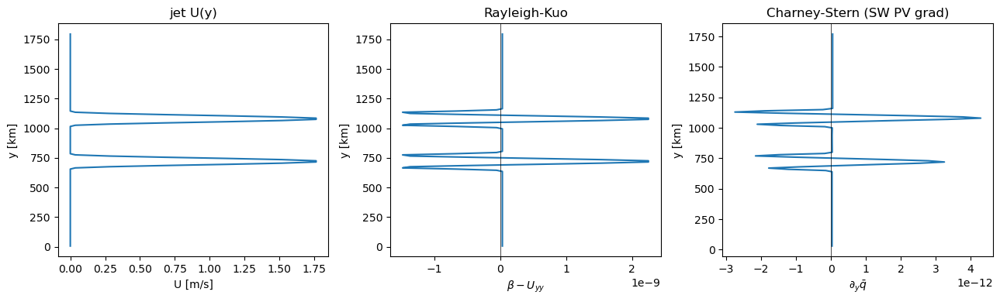

In [9]:
# Barotropic-instability criterion (Rayleigh-Kuo / Charney-Stern): a NECESSARY
# condition for instability is that the background potential-vorticity gradient
# changes sign in the interior. Evaluated on the initial balanced jet.
# See https://en.wikipedia.org/wiki/Rayleigh%E2%80%93Kuo_criterion

U   = M.u[0].mean(axis=1)                          # U(y)
Uyy = np.gradient(np.gradient(U, M.yh1), M.yh1)
RK  = M.beta - Uyy                                 # Rayleigh-Kuo (non-divergent barotropic)
dqdy = np.gradient(M.q(k=0).mean(axis=1), M.yq1)   # Charney-Stern: d/dy of zonal-mean SW PV
dqdy[:3] = np.nan                                  # mask near-wall rows where h->0 makes
dqdy[-2:] = np.nan                                 # q=(f+zeta)/h spike and swamp the interior

fig, ax = plt.subplots(1, 3, figsize=(13, 4))
ax[0].plot(U, M.yh1/1e3);    ax[0].set_xlabel('U [m/s]'); ax[0].set_ylabel('y [km]'); ax[0].set_title('jet U(y)')
ax[1].plot(RK, M.yh1/1e3);   ax[1].axvline(0, color='k', lw=0.5); ax[1].set_xlabel(r'$\beta - U_{yy}$'); ax[1].set_ylabel('y [km]'); ax[1].set_title('Rayleigh-Kuo')
ax[2].plot(dqdy, M.yq1/1e3); ax[2].axvline(0, color='k', lw=0.5); ax[2].set_xlabel(r'$\partial_y \bar{q}$'); ax[2].set_ylabel('y [km]'); ax[2].set_title('Charney-Stern (SW PV grad)')
fig.tight_layout()
# With the near-wall spike masked, the interior sign change in the SW PV gradient is
# visible in the Charney-Stern panel; the Rayleigh-Kuo panel is the cleaner read.

jj = (M.yh1/M.Ly > 0.12) & (M.yh1/M.Ly < 0.88)     # interior (skip dry walls)
print('Rayleigh-Kuo (beta - U_yy) changes sign in interior:', bool((RK[jj].min() < 0) and (RK[jj].max() > 0)))

In [10]:
# Run the model — Sim 1: full simulation, recording (u,v,h) at the two boundary
# columns EVERY step (h at end-of-continuity, u/v at end-of-solve).  # [OBC]
# %time u,v,h,time = M.run(*run_params)                          # original (no recording)


# control where to store the downstream data
# probe_i0 = int(np.where(M.xh1 > 600e3)[0].min())   # [OBC]

# run with storing end of sponge layer
# %time u, v, h, time, h_bc_all, u_bc_all, v_bc_all, probe = M.run_record_bc(*run_params, west_cols, 
# st)  # [OBC]

# [OBC - Orlanski]
# The probe here was originally for storing downstream data for training, I will also store the downstream data for running an improved orlanski scheme. 

b_obc = M.ni - 20                # [OBC - Orlanski] eastern OBC column (interior; run_obc needs 2 <= b < ni-1)
ext_cols = np.array([b_obc + 1, b_obc + 2])    # [OBC - Orlanski] initialize the column stored for exterior of the orlanski open boundary
pres_cols = np.concatenate([west_cols])
# pres_cols = np.concatenate([west_cols, ext_cols]) 
ic = (M.u.copy(), M.v.copy(), M.h.copy(), M.time, M.iter)

u, v, h, time, h_bc_all, u_bc_all, v_bc_all, probe = M.run_record_bc(
    *run_params, pres_cols,
    store_downstream=True, probe_i0=b_obc - 2, n_probe = 3)   
# These are the columns for external forcing
h_ext_all = probe['h'][:, :, :, 2] # (nstep, nk, nj) -- column of the boundary, time series
v_ext_all = probe['v'][:, :, :, 2]
u_ext_all = probe['u'][:, :, :, 2]

# These are the columns for computing phase velocity for control run



# run with storing end of sponge layer + somewhere downstream. 
# %time u, v, h, time, h_bc_all, u_bc_all, v_bc_all, probe = M.run_record_bc(*run_params, west_cols, store_downstream=True, probe_i0=probe_i0, n_probe=2)  # [OBC]

numba threads = 16
CFL: dt*f = 0.03074
CFL: dt*cg/dx = 0.16
CFL: dt*nu_h/dx^2 = 0.0004
CFL*: dt*epsilon/h_bot = 6.25e-06
CFL*: dt*nu_v/h_min^2 = 0.0
CFL*: dt*h_relax = 0.002
CFL*: dt*u_relax = 0.002
CFL*: dt*v_relax = 0.002
nsteps = 50000
Time: Trun * fo = 1000.0
Time: Trun * ( cg / L ) = 66.66666666666667
[OBC] recording (u,v,h) at boundary columns i = [np.int64(0), np.int64(1), np.int64(2), np.int64(3), np.int64(4), np.int64(5), np.int64(6), np.int64(7), np.int64(8), np.int64(9), np.int64(10), np.int64(11), np.int64(12), np.int64(13), np.int64(14)]
[OBC] also storing downstream probe at columns i = 98..100
Running (record)...
...done


# Plots and Animations

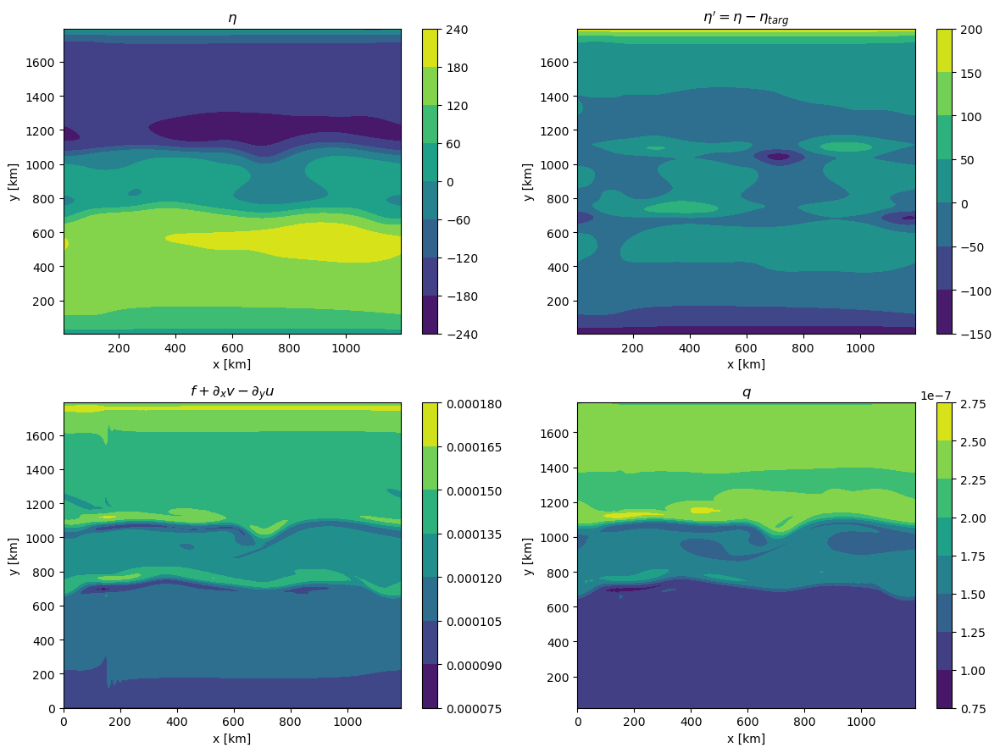

In [11]:
# Snapshot
fig, axs = plt.subplots(2, 2, figsize=(12, 9))
cs = axs[0,0].contourf( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) ); fig.colorbar(cs, ax=axs[0,0]); axs[0,0].set_title(r"$\eta$");
cs = axs[0,1].contourf( M.xh1/1e3, M.yh1/1e3, M.eta(k=0) - (M.h_target[0] - M.D) ); fig.colorbar(cs, ax=axs[0,1]); axs[0,1].set_title(r"$\eta' = \eta - \eta_{targ}$");
cs = axs[1,0].contourf( M.xq1/1e3, M.yq1/1e3, M.abs_omega(k=0) ); fig.colorbar(cs, ax=axs[1,0]); axs[1,0].set_title(r'$f + \partial_x v - \partial_y u$');
cs = axs[1,1].contourf( M.xq1/1e3, M.yq1[2:-2]/1e3, M.q(h=h[-1], u=u[-1], v=v[-1], k=0)[2:-2,:] ); fig.colorbar(cs, ax=axs[1,1]); axs[1,1].set_title(r'$q$');
for a in axs.ravel():
    a.set_xlabel('x [km]'); a.set_ylabel('y [km]')
fig.tight_layout();

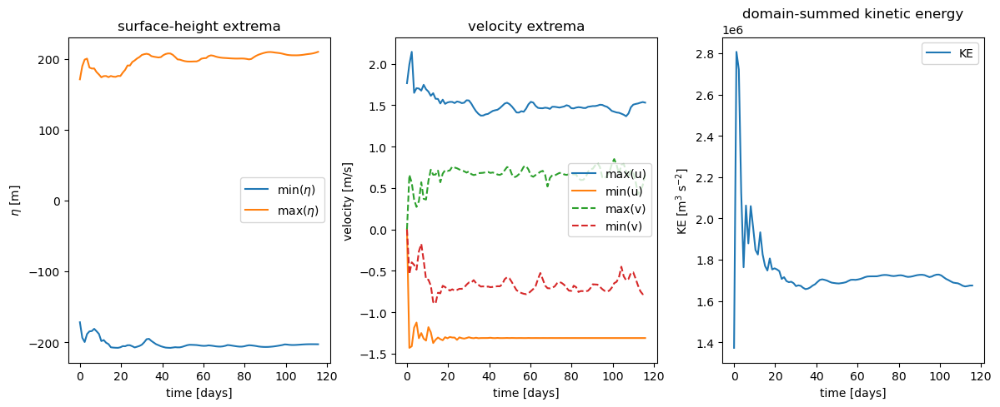

In [12]:
# Plot time series
fig,ax = plt.subplots(1,3,figsize=(12,5))
ax[0].plot( time/86400, (h - M.D).min(axis=(1,2,3)), label=r'min($\eta$)' )
ax[0].plot( time/86400, (h - M.D).max(axis=(1,2,3)), label=r'max($\eta$)' )
ax[0].set_xlabel('time [days]'); ax[0].set_ylabel(r'$\eta$ [m]'); ax[0].set_title('surface-height extrema'); ax[0].legend();
ax[1].plot( time/86400, u.max(axis=(1,2,3)), label='max(u)' )
ax[1].plot( time/86400, u.min(axis=(1,2,3)), label='min(u)' )
ax[1].plot( time/86400, v.max(axis=(1,2,3)), '--', label='max(v)' )
ax[1].plot( time/86400, v.min(axis=(1,2,3)), '--', label='min(v)' )
ax[1].set_xlabel('time [days]'); ax[1].set_ylabel('velocity [m/s]'); ax[1].set_title('velocity extrema'); ax[1].legend();
ax[2].plot( time/86400, M.KE(h=h, u=u, v=v).sum(axis=(1,2,3)), label='KE' )
ax[2].set_xlabel('time [days]'); ax[2].set_ylabel(r'KE [m$^3$ $\text{s}^{-2}$]'); ax[2].set_title('domain-summed kinetic energy'); ax[2].legend();
fig.tight_layout();

In [13]:
# Animate
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

fig, ax = plt.subplots()
# Compute PV for all time levels
pv = np.array([M.q(h=h[n], u=u[n], v=v[n], k=0) for n in range(len(time))])
# pv[:,:3,:] = 1e-7
# pv[:,-2:,:] = 1e-7

# Use consistent color limits across frames
vmin, vmax = pv.min(), pv.max()
cf = ax.contourf(M.xq1/1e3, M.yq1/1e3, pv[-1], levels=100, vmin=vmin, vmax=vmax)
cb = fig.colorbar(cf)
ax.axvline(150, color='k', ls=':', lw=1)              # sponge edge: free model is east of x=150 km
ax.set_xlabel('x [km]'); ax.set_ylabel('y [km]')
title = ax.set_title(f'$q$ at t = {time[0]/86400:.2f} days')

def update(n):
    ax.clear()
    ax.contourf(M.xq1/1e3, M.yq1/1e3, pv[n], levels=100, vmin=vmin, vmax=vmax)
    ax.axvline((Lw_uv +ratio_temp * Lw_uv)/1e3, color='k', ls=':', lw=1)          # sponge edge (ax.clear wipes it)
    ax.set_xlabel('x [km]'); ax.set_ylabel('y [km]')  # restore labels (ax.clear wipes them)
    ax.set_title(f'$q$ at t = {time[n]/86400:.2f} days')

anim = FuncAnimation(fig, update, frames=len(time), interval=100)
anim.save('pv_evolution.gif', writer='pillow', fps=10, dpi=100)   # save GIF (no ffmpeg needed)
plt.close(fig)
HTML(anim.to_jshtml())

# OBC scaffolding: prescribed-boundary replay (Sim 2)

Sim 2 re-runs from the **same initial condition** with the sponge still active, but at
every step it overwrites the two boundary columns (`i = i_edge-1, i_edge`) with the
**stored** data from Sim 1 — `h` right after the continuity update, then `(u,v)` right
after the implicit Coriolis solve. Information thus enters the interior at that edge only
through the prescribed data.

Then an entire column downstream is also replaced by a Orlanski-Scheme like open boundary condition. 

The parameters for this run can be altered so that we could test the effect of the prescribed data. 

In [14]:
# # Barotropic instability in a channel: a balanced zonal jet maintained by a
# # localized western sponge (beta-plane).

# # nj, ru_params = [dt, steps/segment, segments]
# # nj, run_params = 40, [200., 500, 25]  # Barely permitted eddies
# nj, run_params = 120, [200., 500, 100]  # Coarsest resolution with good instabilities
# # nj, run_params = 120, [50., 2000, 100]  # Finer resolution
# # nj, run_params = 180, [5., 5000, 100]  # Finer resolution is very unstable

# M = SSWEM(nj,
#           0.08,    # Gravity [m s-2]
#           800.,    # Nominal layer thickness [m]
#           1200.e3,  # Domain width [m]  (50% longer in x than y)
#           1.e-4,   # Coriolis [s-1]
#           3.0e-11, # df/dy [m-1 s-1]  (beta-plane arrests the large-scale meridional mode)
#           2.5e-5,  # Bottom drag rate [m s-1]
#           2e2,     # Lateral viscosity [m2 s-1]
#           nj=nj    # Rectangular channel
#           )
# # M.D[0,:] = 0       # dry rows N/S -> zonal channel walls
# # M.D[-1,:] = 0

# # Target zonal jet and its geostrophically balanced free surface (f u = -g d(eta)/dy)
# M.set_u_target_jet(1.0)                            # u_target = jet(y)
# uy  = M.u_target[0].mean(axis=1)                   # u(y)
# f_h = M.fo + M.beta * M.yh1                        # f(y) at row centres
# eta = -(1.0/M.g[0]) * np.cumsum(f_h * uy) * M.dy
# eta -= eta.mean() # Why remove mean? 
# hbal = np.maximum(M.D + eta[:, None], 0.0)         # balanced thickness
# hbal[0, :] = hbal[1, 1]
# hbal[-1, :] = hbal[-2, 1]

# Sponge Layer Setup

In [15]:
# # Rate for Northern and Southern boundary should be kept fixed

# # Defualt
# rate_h_w, rate_uv_w = 1.e-5, 1.e-5

# # Smaller rate
# # rate_h_w, rate_uv_w= 1.e-6, 1.e-6


# # Western sponge: the eastern ramp shifted to [0, Lw + d] -- same W->E rise (0 at x=0 up to
# # the max), then masked to 0 beyond Lw so it drops discontinuously to 0 at x=Lw + d

# # Rebuild the sponge layer, only change the horizontal sponge. 
# M.u_relax  = np.maximum( 
#     np.maximum( rate_uv_w * ramp2(M.xu, 0., Lw_uv) * (M.xu < Lw_uv + width), 
#     rate_uv_ns * ramp(M.yu, M.Ly - yb, M.Ly) ), 
#     rate_uv_ns * ramp(M.Ly - M.yu, M.Ly - yb, M.Ly) 
#     )

# M.v_relax  = np.maximum( 
#     np.maximum( rate_uv_w * ramp2(M.xv, 0., Lw_uv) * (M.xv < Lw_uv + width), 
#     rate_uv_ns * ramp(M.yv, M.Ly - yb, M.Ly) ), 
#     rate_uv_ns * ramp(M.Ly - M.yv, M.Ly - yb, M.Ly) 
#     )

# M.h_relax  = np.maximum( 
#     np.maximum( rate_h_w * ramp2(M.xh, 0., Lw_uv) * (M.xh < Lw_uv + width), 
#     rate_h_ns * ramp(M.yh, M.Ly - yb, M.Ly) ), 
#     rate_h_ns * ramp(M.Ly - M.yh, M.Ly - yb, M.Ly) 
#     )

# M.h_target = hbal[None, :, :].copy()               # u_target/v_target already set (jet / 0)

  

In [16]:
# # Balanced initial state everywhere + a small smooth perturbation to seed eddies
# M.u[0] = M.u_target[0].copy()
# M.h[0] = hbal.copy()
# M.perturb_h(20., 0.05 * M.Lx, 3.e5, 0.55 * M.Ly)

# Original Run with Prescribed Boundary Value

In [17]:
# # [OBC] Sim 2 (replace): reset to the snapshotted IC, then run with the boundary
# # [OBC] columns overwritten by the stored data each step.
# M.u[:], M.v[:], M.h[:] = ic[0], ic[1], ic[2]      # [OBC] restore state
# M.time, M.iter = ic[3], ic[4]                      # [OBC] restore time/iter

# %time u2, v2, h2, time2, diffs = M.run_replace_bc(*run_params, pres_cols, h_bc_all, u_bc_all, v_bc_all)  # [OBC]

# # [OBC] Sampled-snapshot agreement with Sim 1 (expected exactly 0.0).
# print('max|h2 - h| =', np.max(np.abs(h2 - h)))
# print('max|u2 - u| =', np.max(np.abs(u2 - u)))
# print('max|v2 - v| =', np.max(np.abs(v2 - v)))

In [18]:
# # [OBC] Comparison results: per-step boundary misfit (free evolution vs stored) that is
# # [OBC] reported and then replaced at each step. Expected ~0 (machine epsilon / exactly 0).
# td = diffs['t_step'] / 86400.0
# fig, ax = plt.subplots(1, 2, figsize=(12, 4))
# for key, lab in [('h_max', r'$h$'), ('u_max', r'$u$'), ('v_max', r'$v$')]:
#     ax[0].plot(td, diffs[key], label=lab)
# ax[0].set_xlabel('time [days]'); ax[0].set_ylabel('max |free - stored|')
# ax[0].set_title('OBC boundary misfit (max-abs)'); ax[0].legend()
# for key, lab in [('h_rms', r'$h$'), ('u_rms', r'$u$'), ('v_rms', r'$v$')]:
#     ax[1].plot(td, diffs[key], label=lab)
# ax[1].set_xlabel('time [days]'); ax[1].set_ylabel('RMS |free - stored|')
# ax[1].set_title('OBC boundary misfit (RMS)'); ax[1].legend()
# fig.tight_layout()

# print('overall max boundary misfit:  '
#       f"h={diffs['h_max'].max():.3e}  u={diffs['u_max'].max():.3e}  v={diffs['v_max'].max():.3e}")

# Original Run with Prescribed West Boundary + Orlanski East Boundary

In [19]:
# Only Run for the First Several Steps
run_params = [200.,500, 100]   # comparison only: same dt=200, record every step, 500 segments

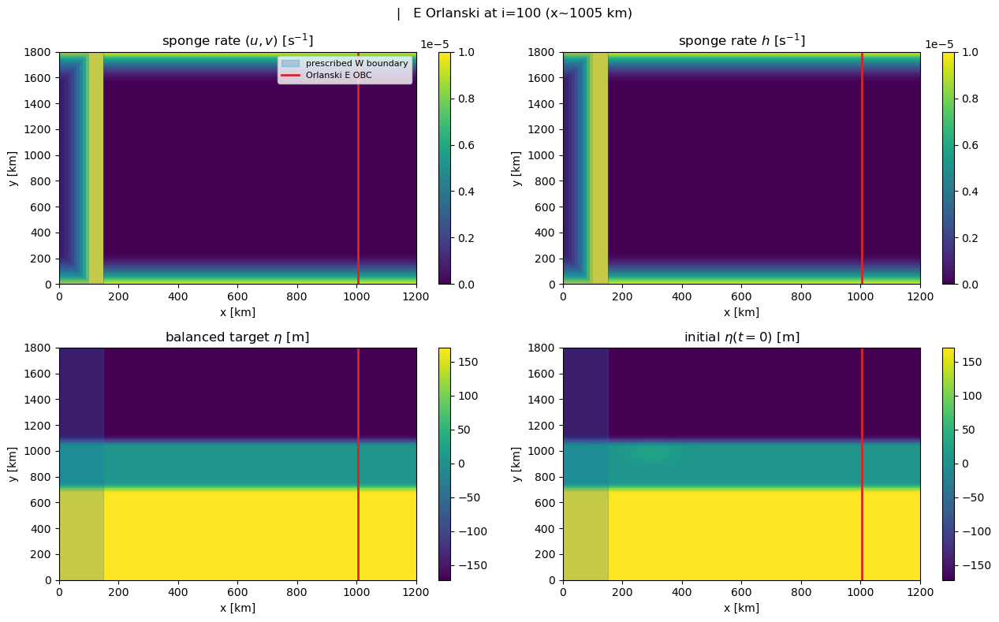

In [20]:
# b_obc = M.ni - 1 - 20                          # [OBC - Orlanski] eastern OBC column (also set in the run cell)
x_km  = M.xh1 / 1e3
y_km  = M.yh1 / 1e3
dx_km = M.dx / 1e3
eta_init = ic[2][0] - M.D                 # initial eta from the IC snapshot
eta_targ = M.h_target[0] - M.D            # balanced target eta
xW0 = x_km[west_cols.min()] - dx_km / 2     # prescribed-W band edges [km]
xW1 = x_km[west_cols.max()] + dx_km / 2
xE  = x_km[b_obc]                         # Orlanski-E column [km]

def _mark(ax):
    ax.axvspan(xW0, xW1, color='tab:blue', alpha=0.25, label='prescribed W boundary')
    ax.axvline(xE, color='tab:red', lw=2, label='Orlanski E OBC')

fig, ax = plt.subplots(2, 2, figsize=(13, 8))
p = ax[0,0].pcolormesh(x_km, y_km, M.u_relax[0]); fig.colorbar(p, ax=ax[0,0]); ax[0,0].set_title(r'sponge rate $(u,v)$ [s$^{-1}$]')
p = ax[0,1].pcolormesh(x_km, y_km, M.h_relax[0]); fig.colorbar(p, ax=ax[0,1]); ax[0,1].set_title(r'sponge rate $h$ [s$^{-1}$]')
p = ax[1,0].pcolormesh(x_km, y_km, eta_targ);     fig.colorbar(p, ax=ax[1,0]); ax[1,0].set_title(r'balanced target $\eta$ [m]')
p = ax[1,1].pcolormesh(x_km, y_km, eta_init);     fig.colorbar(p, ax=ax[1,1]); ax[1,1].set_title(r'initial $\eta(t{=}0)$ [m]')
for a in ax.ravel():
    _mark(a); a.set_xlabel('x [km]'); a.set_ylabel('y [km]')
ax[0,0].legend(loc='upper right', fontsize=8)
fig.suptitle(f'   |   E Orlanski at i={b_obc} (x~{xE:.0f} km)')
fig.tight_layout()

In [21]:
M.u[:], M.v[:], M.h[:] = ic[0], ic[1], ic[2]      # restore IC
M.time, M.iter = ic[3], ic[4]
u3, v3, h3, time3, diff3, rx = M.run_obc(*run_params, pres_cols, h_bc_all, u_bc_all, v_bc_all, b_obc, h_ext_all = h_ext_all, u_ext_all = u_ext_all, v_ext_all = v_ext_all)

numba threads = 16
CFL: dt*f = 0.03074
CFL: dt*cg/dx = 0.16
CFL: dt*nu_h/dx^2 = 0.0004
CFL*: dt*epsilon/h_bot = 6.25e-06
CFL*: dt*nu_v/h_min^2 = 0.0
CFL*: dt*h_relax = 0.002
CFL*: dt*u_relax = 0.002
CFL*: dt*v_relax = 0.002
nsteps = 50000
Time: Trun * fo = 1000.0
Time: Trun * ( cg / L ) = 66.66666666666667
...done
Mean r_x over run is h = 0.149u=0.127  v=0.089


In [22]:
# [1D-2D] Sim 3 (2D scheme): same setup / IC / truth as the 1D run above, but the east OBC
# uses the 2D oblique Orlanski operator (adds the tangential r_y term). Built on the 2D module
# with IDENTICAL config + IC. Inflow is hard-prescribed to the recorded external column
# (nudging=True, alpha_in=1.0 == hard prescribe), matching the 1D module's inflow exactly --
# so the ONLY difference between this run and the 1D run is the 2D scheme (r_y).
M2 = SSWEM_2D(2 * nj // 3, 
              0.08, 800., 1200.e3, 1.e-4, 3.0e-11, 2.5e-5, 2e2, nj=nj)  # same constructor as M
# copy the configured sponge + targets from the 1D model M (set up above)
M2.u_target = M.u_target.copy(); M2.h_target = M.h_target.copy()
M2.u_relax  = M.u_relax.copy();  M2.v_relax  = M.v_relax.copy();  M2.h_relax = M.h_relax.copy()
# same initial condition as Sim1 / Sim3-1D
M2.u[:], M2.v[:], M2.h[:] = ic[0], ic[1], ic[2]
M2.time, M2.iter = ic[3], ic[4]

u3_2d, v3_2d, h3_2d, time3_2d, diff3_2d, rx_2d = M2.run_obc(
    *run_params, pres_cols, h_bc_all, u_bc_all, v_bc_all, b_obc,
    nudging=False,                                      # hard-prescribe inflow = phi_ext (matches 1D)
    h_ext_all=h_ext_all, u_ext_all=u_ext_all, v_ext_all=v_ext_all, alpha_in = 0.99)

mesh: ni = 120  nj = 180
Grid: dx = 10000.0 [m]  dy = 10000.0 [m]
cg = 8.0 [m s-1]
Ld = 80000.0 [m]
Scales: Ls=epsilon/D/beta = 1041.6666666666667 [m]
Scales: Lx/Ld = 15.0
Res: Ld/dx = 8.0
Res: Ls/dx = 0.10416666666666667
numba threads = 16
CFL: dt*f = 0.03074
CFL: dt*cg/dx = 0.16
CFL: dt*nu_h/dx^2 = 0.0004
CFL*: dt*epsilon/h_bot = 6.25e-06
CFL*: dt*nu_v/h_min^2 = 0.0
CFL*: dt*h_relax = 0.002
CFL*: dt*u_relax = 0.002
CFL*: dt*v_relax = 0.002
nsteps = 50000
Time: Trun * fo = 1000.0
Time: Trun * ( cg / L ) = 66.66666666666667
[OBC - Orlanski - 2D - IndepRx] east r_x estimated independently per field (h, u, v)
[OBC - Orlanski - 2D - Nuding] east inflow scheme: PRESCRIBE (hard-set col b = external)
...done
Mean r_x over run is h = 0.019u=0.016  v=0.025


In [ ]:
# [1D-2D] PV (q) animation comparing the schemes.  SHOW_CONTROL knob:                                                 # [CTRL]
#   True  -> control truth | 1D Orlanski | 2D Orlanski (radiate h)  (3 panels; runs must share dt/samp)  # [CTRL][RM-ZG]
#   False -> 1D Orlanski | 2D Orlanski (radiate h)  (2 panels, on the Orlanski runs' own clock)          # [CTRL][RM-ZG]
# OBC runs cropped to columns 0..b_obc; the dashed line marks the open boundary.
import matplotlib as mpl
from matplotlib.animation import FuncAnimation, HTMLWriter, PillowWriter   # [GIF] PillowWriter
from IPython.display import HTML
from pathlib import Path

mpl.rcParams['animation.embed_limit'] = 200.0        # MB; default 20 silently drops tail frames

SHOW_CONTROL = True    # [CTRL] include the control-truth panel? True needs the control on the SAME dt/samp as the Orlanski runs

bx     = int(b_obc)
c0     = int(west_cols.max()) + 1   # [WCROP] start one column EAST of the western sponge edge (skip the prescribed band)
jcut   = slice(2, -2)
_clocks = [time3, time3_2d]                                     # [CTRL][RM-ZG] the Orlanski runs' own time arrays
if SHOW_CONTROL:                                               # [CTRL] only let the control constrain the frame count when it's shown
    _clocks = [time] + _clocks                                # [CTRL]
nfr    = min(len(t) for t in _clocks)                          # [CTRL] frame count from the active runs only
STRIDE = max(1, nfr // 60)
flist  = list(range(0, nfr, STRIDE))

def _pv(hh, uu, vv):                                  # PV per displayed frame, cropped to 0..b_obc
    return np.array([M.q(h=hh[n], u=uu[n], v=vv[n], k=0)[jcut, c0:bx + 1] for n in flist])   # [WCROP] crop x to c0..b_obc

_orl = [('1D Orlanski',             _pv(h3,     u3,     v3)),                     # [CTRL][RM-ZG] the 2 Orlanski schemes
        ('2D Orlanski (radiate h)', _pv(h3_2d,  u3_2d,  v3_2d))]                  # [CTRL]
panels = ([('control (truth)', _pv(h, u, v))] + _orl) if SHOW_CONTROL else _orl  # [CTRL] prepend control only when shown

xkm, ykm = M.xq1[c0:bx + 1] / 1e3, M.yq1[jcut] / 1e3   # [WCROP]
ext   = [xkm.min(), xkm.max(), ykm.min(), ykm.max()]
# [CBAR] match the control animation colorbar above: full control PV field over ALL frames
vmin, vmax = (lambda p: (p.min(), p.max()))(
    np.array([M.q(h=h[n], u=u[n], v=v[n], k=0) for n in range(len(time))]))   # [CBAR] same range as cell 9
td_a  = (time if SHOW_CONTROL else time3)[:nfr] / 86400.0       # [CTRL] control clock when shown, else the Orlanski runs' clock

npanel = len(panels)                                             # [CTRL][RM-ZG] 3 with control, else 2
fig, axs = plt.subplots(1, npanel, figsize=(5 * npanel, 5), constrained_layout=True)   # [CTRL] dynamic panel count
N_LEVELS = 100
cmap = plt.get_cmap('viridis', N_LEVELS)
ims = []
for ax, (title, fld) in zip(axs, panels):
    im = ax.imshow(fld[0], origin='lower', extent=ext, cmap=cmap,
                   vmin=vmin, vmax=vmax, aspect='auto', interpolation='nearest')
    ax.axvline(xkm[-1], color='k', ls='--', lw=1.2)
    ax.set_title(title); ax.set_xlabel('x [km]'); ax.set_ylabel('y [km]')
    ims.append(im)
fig.colorbar(ims[0], ax=axs, shrink=0.85, label=r'$q=(f+v_x-u_y)/h$  [s$^{-1}$m$^{-1}$]')
ttl = fig.suptitle('')

def _update(i):
    for im, (_, fld) in zip(ims, panels): im.set_data(fld[i])
    ttl.set_text(f"potential vorticity $q$  |  t = {td_a[flist[i]]:.1f} days   (b_obc={bx}, dashed line)")
    return ims

anim = FuncAnimation(fig, _update, frames=len(flist), interval=150, blit=False)
plt.close(fig)
# render the JS player to an explicit file (avoids the Windows TemporaryDirectory race in to_jshtml)
_html = Path(f'obc_compare_pv_{npanel}panel.html')              # [CTRL] filename reflects the panel count
anim.save(str(_html), writer=HTMLWriter(fps=8, embed_frames=True))
_gif = Path(f'obc_compare_pv_{npanel}panel.gif')                # [CTRL][GIF] output path
anim.save(str(_gif), writer=PillowWriter(fps=8), dpi=90)                   # [GIF] write GIF (no ffmpeg needed)
print(f'[1D-2D-ANIM] {len(flist)} frames, stride {STRIDE}, q-range [{vmin:.2e}, {vmax:.2e}] -> {_html}')
print(f'[GIF] saved {_gif}  ({_gif.stat().st_size / 1e6:.1f} MB)')          # [GIF] report file size
HTML(_html.read_text(encoding='utf-8'))

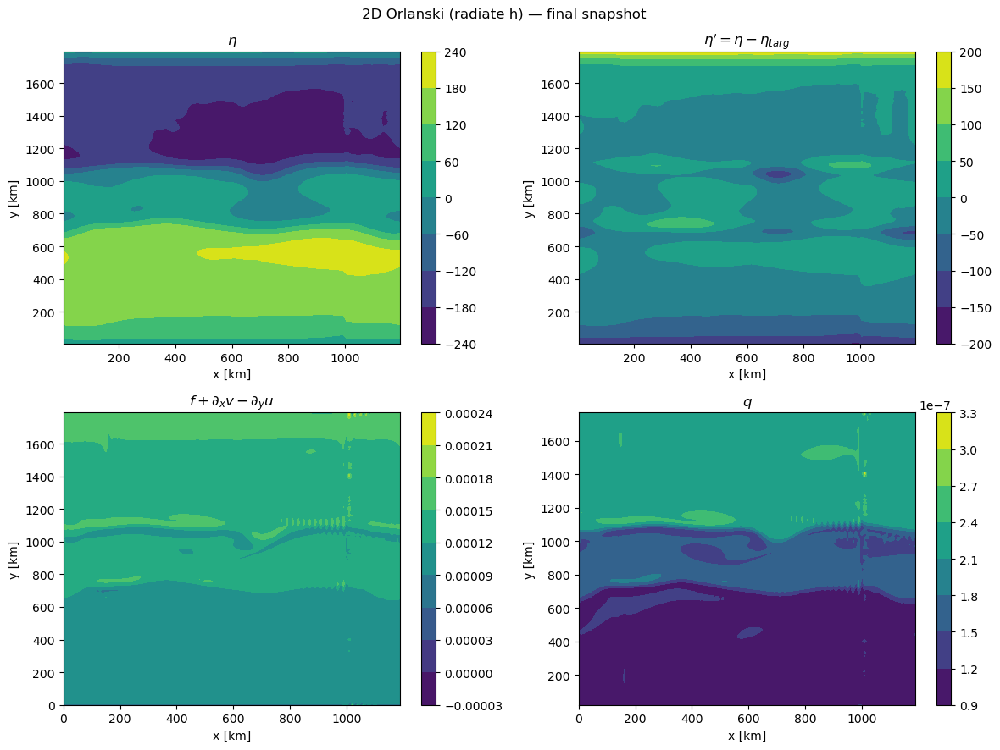

In [24]:
# Snapshot — 2D Orlanski (radiate h) scheme, final frame   # [2D-SNAP]
h2d, u2d, v2d = h3_2d[-1], u3_2d[-1], v3_2d[-1]                 # [2D-SNAP][RM-ZG] last-frame radiate-h fields
fig, axs = plt.subplots(2, 2, figsize=(12, 9))
cs = axs[0,0].contourf( M.xh1/1e3, M.yh1/1e3, M.eta(h=h2d, k=0) ); fig.colorbar(cs, ax=axs[0,0]); axs[0,0].set_title(r"$\eta$");   # [2D-SNAP]
cs = axs[0,1].contourf( M.xh1/1e3, M.yh1/1e3, M.eta(h=h2d, k=0) - (M.h_target[0] - M.D) ); fig.colorbar(cs, ax=axs[0,1]); axs[0,1].set_title(r"$\eta' = \eta - \eta_{targ}$");   # [2D-SNAP]
cs = axs[1,0].contourf( M.xq1/1e3, M.yq1/1e3, M.abs_omega(u=u2d, v=v2d, k=0) ); fig.colorbar(cs, ax=axs[1,0]); axs[1,0].set_title(r'$f + \partial_x v - \partial_y u$');   # [2D-SNAP]
cs = axs[1,1].contourf( M.xq1/1e3, M.yq1[2:-2]/1e3, M.q(h=h2d, u=u2d, v=v2d, k=0)[2:-2,:] ); fig.colorbar(cs, ax=axs[1,1]); axs[1,1].set_title(r'$q$');   # [2D-SNAP]
for a in axs.ravel():
    a.set_xlabel('x [km]'); a.set_ylabel('y [km]')
fig.suptitle('2D Orlanski (radiate h) — final snapshot')   # [2D-SNAP]
fig.tight_layout();

# Sim 3 and Truch Comparision

Side-by-side PV animation of the three runs (original / prescribed-W / Orlanski-E) and
the misfit of $(u,v,\eta)$ at the OBC column. (The Sim 3 configuration is plotted above,
before the run.)

final interior RMS error:  1D  u=4.643e-02 v=2.817e-02 eta=6.887e+00   |   2D  u=4.109e-02 v=2.657e-02 eta=6.913e+00


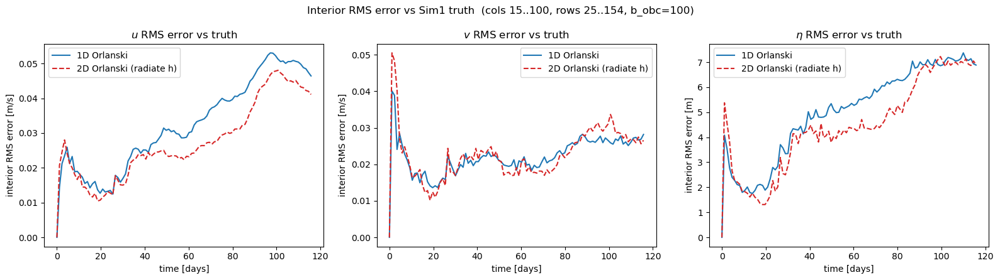

In [25]:
# [1D-2D][RM-ZG] RMS error vs the truth (Sim1), for the 1D Orlanski and 2D Orlanski (radiate h)
# schemes.
# Error over the INTERIOR (columns between the prescribed-W band and the OBC, skipping the
# dry N/S walls and the N/S sponge band), per output frame. If a scheme reflects less, its curves sit lower.
ii = slice(int(west_cols.max()) + 1, int(b_obc) + 1) # interior: west of OBC up to & incl. b_obc
# [OBC] interior rows: drop the N/S sponge band (the dry walls sit inside it). Keep a row only
#       where the relax rate is 0 across the interior columns ii -- there the western sponge is
#       already 0, so only the N/S sponge can flag a row. Auto-tracks the active sponge width.
_ns_free = (M.h_relax[0, :, ii] == 0).all(axis=1)         # [OBC] h-rows with no N/S sponge
_rows    = np.where(_ns_free)[0]                          # [OBC]
jj       = slice(int(_rows.min()), int(_rows.max()) + 1)  # [OBC] contiguous sponge-free band
nfr = min(len(time), len(time3), len(time3_2d))   # [RM-ZG]

def rms_err(A_scheme, A_truth):                      # RMS over interior (rows, cols) per frame
    d = A_scheme[:nfr, 0, jj, ii] - A_truth[:nfr, 0, jj, ii]
    return np.sqrt(np.nanmean(d**2, axis=(1, 2)))

u_1d = rms_err(u3, u);             u_2d = rms_err(u3_2d, u)          # [RM-ZG]
v_1d = rms_err(v3, v);             v_2d = rms_err(v3_2d, v)          # [RM-ZG]
h_1d = rms_err(h3 - M.D, h - M.D); h_2d = rms_err(h3_2d - M.D, h - M.D)   # [RM-ZG]
td = time[:nfr] / 86400.0

fig, ax = plt.subplots(1, 3, figsize=(16, 4.5))
for a, (e1, e2, lab, unit) in zip(ax, [(u_1d, u_2d, 'u', 'm/s'),          # [RM-ZG]
                                       (v_1d, v_2d, 'v', 'm/s'),          # [RM-ZG]
                                       (h_1d, h_2d, r'\eta', 'm')]):      # [RM-ZG]
    a.plot(td, e1, 'C0-',  label='1D Orlanski')
    a.plot(td, e2, 'C3--', label='2D Orlanski (radiate h)')
    a.set_xlabel('time [days]'); a.set_ylabel(f'interior RMS error [{unit}]')
    a.set_title(rf'${lab}$ RMS error vs truth'); a.legend()
fig.suptitle(f'Interior RMS error vs Sim1 truth  (cols {ii.start}..{ii.stop-1}, rows {jj.start}..{jj.stop-1}, b_obc={int(b_obc)})')
fig.tight_layout()
print(f'final interior RMS error:  1D  u={u_1d[-1]:.3e} v={v_1d[-1]:.3e} eta={h_1d[-1]:.3e}   |   '   # [RM-ZG]
      f'2D  u={u_2d[-1]:.3e} v={v_2d[-1]:.3e} eta={h_2d[-1]:.3e}')


Text(0.5, 0.98, 'Pointwise $|u|$ error near the OBC (12 cols west of b_obc=100) - 1D / 2D radiate')

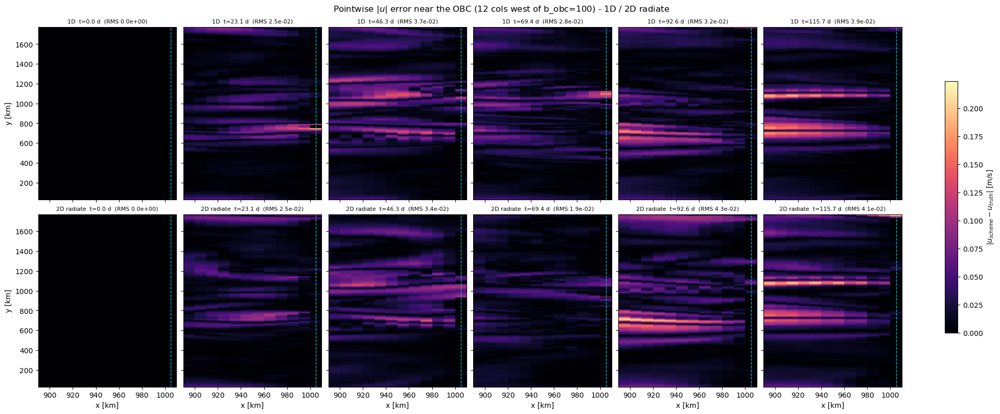

In [26]:
# [1D-2D][RM-ZG] Pointwise maps near the OBC at several snapshots (1D vs 2D radiate).
# Complements the interior-RMS time series above: instead of collapsing space into one number
# per frame, it shows WHERE things happen in the `ncols` columns just west of (and incl.) the
# OBC -- the band where reflection shows up first -- at a few snapshots of the run.
# [CTRL] SHOW_CONTROL (inherited from the animation cell) selects WHAT each panel shows:
# [CTRL]   True  -> pointwise |scheme - truth| error (control & tests share a time axis; verified below).
# [CTRL]   False -> the raw scheme field itself, on the tests' OWN clock. The control is on a different
# [CTRL]            time-step config, so error-vs-truth is undefined -> we do NOT plot the control at all.
SHOW_CONTROL = globals().get('SHOW_CONTROL', True)   # [CTRL] inherit the knob from the animation cell; default True if run standalone
FIELD   = 'u'          # 'u' | 'v' | 'eta'   (eta = h - D)
ncols   = 12             # number of columns BEFORE (west of) the OBC to show (includes b_obc)

# field arrays (truth, 1D, 2D radiate) at layer 0, each (nframes, nj, ni)   # [RM-ZG]
def _fld(name, U, V, H):
    if name == 'u': return U[:, 0]
    if name == 'v': return V[:, 0]
    return H[:, 0] - M.D                              # eta = h - D
A_t   = _fld(FIELD, u,      v,      h)                # Sim1 truth (used only when SHOW_CONTROL)
A_1d  = _fld(FIELD, u3,     v3,     h3)               # Sim3 1D Orlanski
A_2d  = _fld(FIELD, u3_2d,  v3_2d,  h3_2d)            # Sim3 2D Orlanski (radiate h)
unit = 'm' if FIELD == 'eta' else 'm/s'
flab = r'\eta' if FIELD == 'eta' else FIELD

# region: band of columns just west of (and incl.) the OBC; skip dry N/S wall rows
b    = int(b_obc)
c0   = max(0, b - ncols + 1)                          # first column of the band
jj   = slice(3, -3)                                   # interior rows (as in the RMS cell)
xb   = M.xh1[c0:b+1] / 1e3                            # band x [km]
yb   = M.yh1[3:-3]   / 1e3                            # interior y [km]

# [CTRL] frame count: only let the truth array constrain frames when we actually compare against it
_lens = [len(time3), len(time3_2d)] + ([len(time)] if SHOW_CONTROL else [])   # [CTRL][RM-ZG]
nfr   = min(_lens)                                                                             # [CTRL]
if SHOW_CONTROL:                                                                               # [CTRL] error-vs-truth needs a shared time axis (same dt AND samp)
    for _tn, _t in [('time3', time3), ('time3_2d', time3_2d)]:                                # [CTRL][RM-ZG]
        if not np.allclose(time[:nfr], _t[:nfr]):                                              # [CTRL]
            raise ValueError(f"[CTRL] SHOW_CONTROL=True but truth `time` and `{_tn}` disagree over "   # [CTRL]
                             f"frames 0..{nfr}: record the control on the SAME dt/samp as the Orlanski "  # [CTRL]
                             "runs, or set SHOW_CONTROL=False to plot the raw scheme field instead.")     # [CTRL]
_clock = time if SHOW_CONTROL else time3             # [CTRL] truth clock when comparing, else the tests' own clock
snaps = np.arange(0, 200, 20)
snaps = snaps[snaps < nfr]                            # guard against short runs

# [CTRL] per-panel map: |scheme - truth| when comparing against truth, else the raw scheme field (no control)
def _map(A, f):                                                                               # [CTRL]
    return np.abs(A[f, jj, c0:b+1] - A_t[f, jj, c0:b+1]) if SHOW_CONTROL else A[f, jj, c0:b+1]  # [CTRL]
schemes = [(A_1d, '1D'), (A_2d, '2D radiate')]   # [RM-ZG]
if SHOW_CONTROL:                                                                              # [CTRL] error: non-negative magnitude, sequential cmap
    vmin, vmax, cmap = 0.0, max(_map(A, f).max() for A, _ in schemes for f in snaps), 'magma'   # [CTRL]
else:                                                                                         # [CTRL] raw signed field -> symmetric diverging scale about 0
    _vlim = max(np.abs(_map(A, f)).max() for A, _ in schemes for f in snaps)                  # [CTRL]
    vmin, vmax, cmap = -_vlim, _vlim, 'RdBu_r'                                                # [CTRL]

# ---- maps: rows = scheme (1D / 2D radiate), cols = snapshots ----   # [RM-ZG]
nrow = len(schemes)
fig, ax = plt.subplots(nrow, len(snaps), figsize=(3.0 * len(snaps) + 1.5, 4.0 * nrow),
                       sharex=True, sharey=True, constrained_layout=True)
ax = np.asarray(ax).reshape(nrow, len(snaps))
for col, f in enumerate(snaps):
    for row, (A, name) in enumerate(schemes):
        e  = _map(A, f)                                                                       # [CTRL] |error| (True) or raw field (False)
        cs = ax[row, col].pcolormesh(xb, yb, e, cmap=cmap, vmin=vmin, vmax=vmax, shading='auto')  # [CTRL] cmap/limits set by mode
        ax[row, col].axvline(M.xh1[b] / 1e3, color='c', ls='--', lw=1)                 # OBC column
        _rms = f'(RMS {np.sqrt(np.nanmean(e**2)):.1e})' if SHOW_CONTROL else ''               # [CTRL] RMS is only an error when comparing to truth
        ax[row, col].set_title(f'{name}  t={_clock[f]/86400:.1f} d  {_rms}', fontsize=8)      # [CTRL] active clock; RMS only in compare mode
        if row == nrow - 1: ax[row, col].set_xlabel('x [km]')
        if col == 0: ax[row, col].set_ylabel('y [km]')
# [CTRL] colorbar + title wording switch between error-vs-truth and raw-field modes
if SHOW_CONTROL:                                                                              # [CTRL]
    _cbar = rf'$|{flab}_{{scheme}}-{flab}_{{truth}}|$ [{unit}]'                                # [CTRL]
    _sup  = rf'Pointwise $|{flab}|$ error near the OBC ({ncols} cols west of b_obc={b}) - 1D / 2D radiate'  # [CTRL][RM-ZG]
else:                                                                                         # [CTRL]
    _cbar = rf'${flab}$ [{unit}]'                                                              # [CTRL]
    _sup  = rf'Raw ${flab}$ field near the OBC ({ncols} cols west of b_obc={b}; SHOW_CONTROL=False, no truth) - 1D / 2D radiate'  # [CTRL][RM-ZG]
fig.colorbar(cs, ax=ax, label=_cbar, shrink=0.7)                                              # [CTRL]
fig.suptitle(_sup)                                                                            # [CTRL]

49999 time-diff steps;  tblk=62 -> 806 time cols x 180 rows;  c_fac = dx/dt = 50.0 m/s,  cg = 8.00 m/s


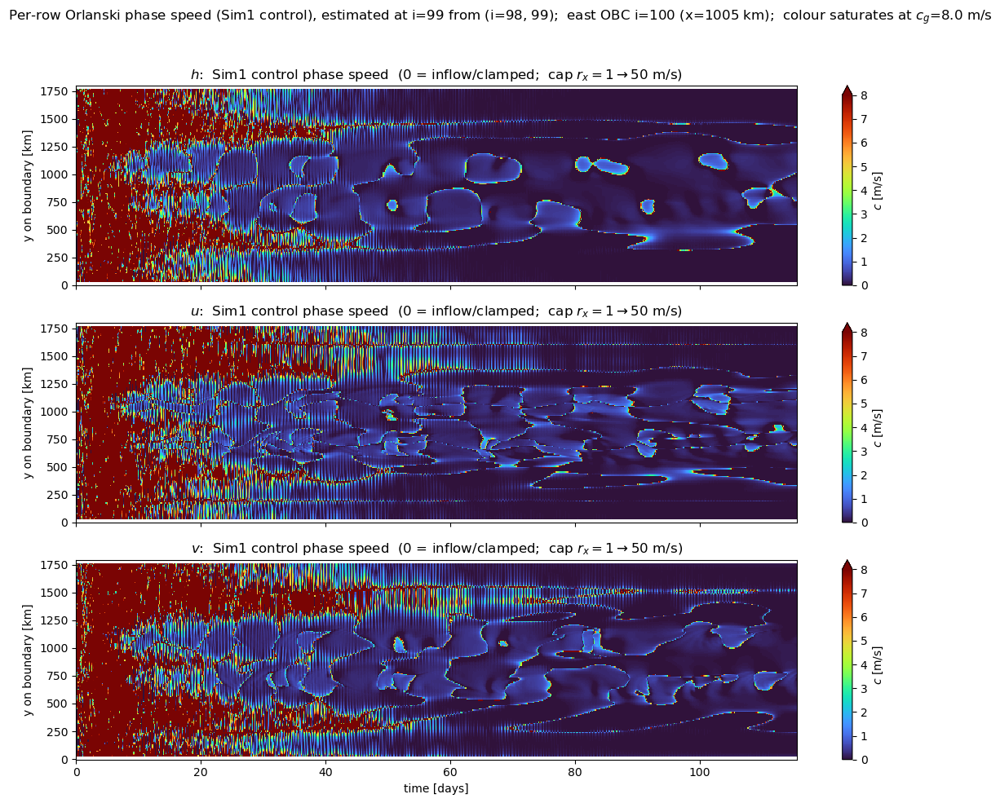

In [27]:
# [OBC - Orlanski] Hovmoller of the per-row Orlanski phase speed of the CONTROL run (Sim1).
# x = time, y = location along the boundary, colour = phase speed c = r_x*dx/dt [m/s].
# Source = the Sim1 PROBE at columns [b_obc-2, b_obc-1, b_obc]. r_x is estimated AT column
# b_obc-1 from (b_obc-1, b_obc-2) -- the SAME column/estimator the scheme uses -- but kept
# PER ROW (no j-average, unlike cell 30) and clipped to [0,1]. One panel each for h, u, v.
import numpy as np, matplotlib.pyplot as plt

assert list(probe['cols']) == [b_obc - 2, b_obc - 1, b_obc], \
    'probe must cover [b_obc-2, b_obc-1, b_obc]: set probe_i0=b_obc-2, n_probe=3 in the Sim-1 cell'

k0    = 0                                                 # single layer
c_fac = M.dx / run_params[0]                              # r_x -> phase speed [m/s]  (= dx/dt)
cg    = np.sqrt(M.g[0] * M.D.max())                       # gravity-wave speed ~8 m/s
jmask = np.r_[0:3, M.nj - 3:M.nj]                         # dry N/S wall rows to blank

def rx_row(phi):                                          # phi: probe (nstep, nk, nj, 3) at (b-2, b-1, b)
    dpt = phi[1:, k0, :, 1] - phi[:-1, k0, :, 1]          # phi^{n+1}_{b-1} - phi^n_{b-1}   per row
    dpx = phi[1:, k0, :, 1] - phi[1:,  k0, :, 0]          # phi_{b-1} - phi_{b-2}  at n+1
    r = np.where(dpx == 0., 0., -dpt / np.where(dpx == 0., 1., dpx))
    return np.clip(r, 0., 1.)                             # (nstep-1, nj); same clip as _orlanski_east

T    = probe['h'].shape[0] - 1                            # number of time-difference steps
tblk = max(1, T // 800)                                   # time-block average (tblk=1 -> full res)
def tavg(c):
    n = (c.shape[0] // tblk) * tblk
    return c[:n].reshape(-1, tblk, c.shape[1]).mean(axis=1)

C = {k: tavg(c_fac * rx_row(probe[k])) for k in 'huv'}    # each (nblk, nj)
for k in C: C[k][:, jmask] = np.nan                       # blank the dry wall rows
t_days = (np.arange(C['h'].shape[0]) + 0.5) * tblk * run_params[0] / 86400.

fig, ax = plt.subplots(3, 1, figsize=(12, 10), sharex=True)
for a, k, yc in [(ax[0], 'h', M.yh1), (ax[1], 'u', M.yh1), (ax[2], 'v', M.yq1)]:
    pm = a.pcolormesh(t_days, yc / 1e3, C[k].T, vmin=0, vmax=cg, cmap='turbo', shading='auto')
    cb = fig.colorbar(pm, ax=a, extend='max'); cb.set_label(r'$c$ [m/s]')
    a.set_ylabel('y on boundary [km]')
    a.set_title(fr'${k}$:  Sim1 control phase speed  (0 = inflow/clamped;  '
                fr'cap $r_x{{=}}1 \to {c_fac:.0f}$ m/s)')
ax[-1].set_xlabel('time [days]')
fig.suptitle(f'Per-row Orlanski phase speed (Sim1 control), estimated at i={int(b_obc)-1} '
             f'from (i={int(b_obc)-2}, {int(b_obc)-1});  east OBC i={int(b_obc)} '
             f'(x={M.xh1[b_obc]/1e3:.0f} km);  colour saturates at $c_g$={cg:.1f} m/s')
fig.tight_layout(rect=(0, 0, 1, 0.96))
print(f'{T} time-diff steps;  tblk={tblk} -> {C["h"].shape[0]} time cols x {M.nj} rows;  '
      f'c_fac = dx/dt = {c_fac:.1f} m/s,  cg = {cg:.2f} m/s')


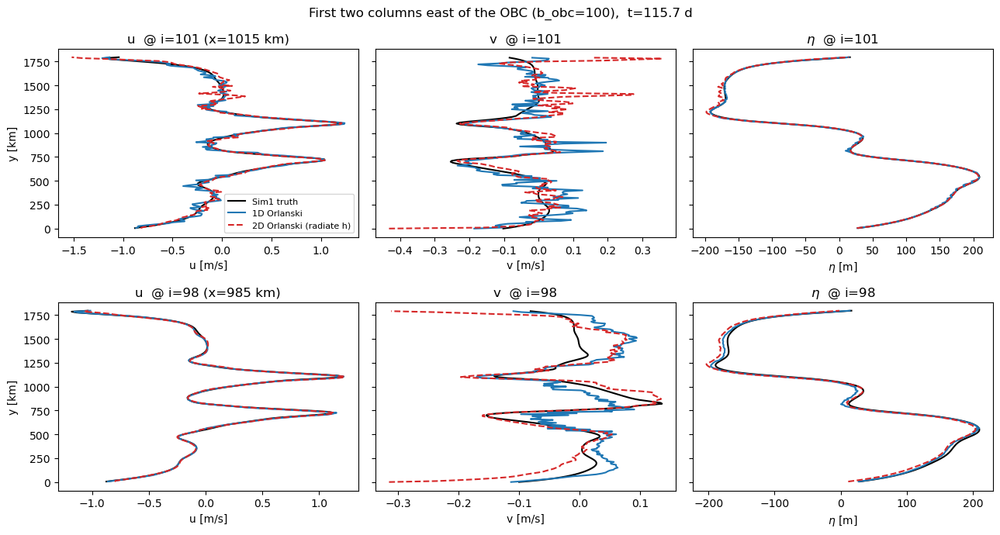

In [28]:
# [OBC] First two columns EAST of the OBC (the red dashed line):
# i = b_obc+1, b_obc+2  (the prescribed "ghost" band).
# Sim1 truth (black) vs the two OBC schemes (1D Orlanski, 2D Orlanski radiate-h), last frame.   # [RM-ZG]
# If the ghost prescribe is working, the schemes should lie on top of Sim1 here.
import numpy as np, matplotlib.pyplot as plt

nf   = min(len(time), len(time3), len(time3_2d)) - 1   # [OBC][RM-ZG] last common output frame (was -300 -> out of bounds when <300 frames)
cols = [int(b_obc) + 1, int(b_obc) - 2]        # first two columns east of the OBC
yh   = M.yh1 / 1e3                              # y of u/h points [km]
yq   = M.yq1 / 1e3                              # y of v points [km]

# [OBC] (u, v, h, line-style, label) for each of the three OBC schemes
schemes = [(u3,     v3,     h3,     'C0-',  '1D Orlanski'),
           (u3_2d,  v3_2d,  h3_2d,  'C3--', '2D Orlanski (radiate h)')]   # [RM-ZG]

fig, ax = plt.subplots(len(cols), 3, figsize=(13, 7), sharey=True)
for r, c in enumerate(cols):
    xk = M.xh1[c] / 1e3
    ax[r,0].plot(u[nf,0,:,c], yh, 'k-', label='Sim1 truth')          # [OBC] truth (black)
    ax[r,1].plot(v[nf,0,:,c], yq, 'k-')
    ax[r,2].plot(h[nf,0,:,c] - M.D[:,c], yh, 'k-')
    for us, vs, hs, sty, lab in schemes:                             # [OBC] overlay the three schemes
        ax[r,0].plot(us[nf,0,:,c], yh, sty, label=lab)
        ax[r,1].plot(vs[nf,0,:,c], yq, sty)
        ax[r,2].plot(hs[nf,0,:,c] - M.D[:,c], yh, sty)
    ax[r,0].set_title(f'u  @ i={c} (x={xk:.0f} km)'); ax[r,0].set_xlabel('u [m/s]'); ax[r,0].set_ylabel('y [km]')
    ax[r,1].set_title(f'v  @ i={c}');                 ax[r,1].set_xlabel('v [m/s]')
    ax[r,2].set_title(rf'$\eta$  @ i={c}');           ax[r,2].set_xlabel(r'$\eta$ [m]')
ax[0,0].legend(fontsize=8)
fig.suptitle(f'First two columns east of the OBC (b_obc={int(b_obc)}),  t={time3[nf]/86400:.1f} d')
fig.tight_layout()

# Phase Velocity Diagonistic

The 2D orlanski run now record the numerical phase velocity it usese to 

In [29]:
#Phase velocity (c_x, c_y) vs time at the CENTRAL boundary row.
import numpy as np, matplotlib.pyplot as plt
import importlib, OSSWEM_obc_orlanski_2D                     
importlib.reload(OSSWEM_obc_orlanski_2D)                       
from OSSWEM_obc_orlanski_2D import SSWEM as SSWEM_2D         

FIELD = 'h'                                   # 'h' | 'u' | 'v' : which field's phase speed to show
k0    = 0
dt    = run_params[0]
dx, dy = M.dx, M.dy
# Which row to plot here. 
jc    = M.nj // 2                    

assert f'rx_{FIELD}_row' in rx_2d, ("rx_2d lacks per-row keys -- re-run the 2D run cell (cell with "
                                    "M2.run_obc) after reloading the updated module.")

# ---- 2D scheme: applied phase speed at the central row (already per-row, every step) ----
rx_sch = rx_2d[f'rx_{FIELD}_row'][:, k0, jc]        
ry_sch = rx_2d[f'ry_{FIELD}_row'][:, k0, jc]         
cx_sch = rx_sch * dx / dt                             # phase speed [m/s]
cy_sch = ry_sch * dy / dt
t_sch  = rx_2d['t_step'] / 86400.0                    # days

# ---- control truth: replicate _orlanski_east at column b-1 from the Sim1 probe ----
# probe[FIELD]: (nstep, nk, nj, 3) at columns (b_obc-2, b_obc-1, b_obc), every step.
assert list(probe['cols']) == [b_obc - 2, b_obc - 1, b_obc], 'probe must cover [b-2, b-1, b]'
P       = probe[FIELD][:, k0]                         # (nstep, nj, 3): col0=b-2, col1=b-1, col2=b
prev_b1 = P[:-1, :, 1]                                # phi^n   at b-1
pim1    = P[1:,  :, 1]                                # phi^{n+1} at b-1
pim2    = P[1:,  :, 0]                                # phi^{n+1} at b-2
dphi_t  = pim1 - prev_b1
dphi_x  = pim1 - pim2
jp = np.roll(prev_b1, -1, axis=1)                     # phi^n_{b-1, j+1}  (y-periodic)
jm = np.roll(prev_b1, +1, axis=1)                     # phi^n_{b-1, j-1}
cen = jp - jm                                         # upwind selector for the tangential slope
dphi_y = np.where(dphi_t * cen > 0.0, prev_b1 - jm, jp - prev_b1)
denom  = dphi_x**2 + dphi_y**2
safe   = np.where(denom == 0.0, 1.0, denom)
rx_c   = np.where(denom == 0.0, 0.0, -dphi_t * dphi_x / safe)
ry_c   = np.where(denom == 0.0, 0.0, -dphi_t * dphi_y / safe)
inflow = rx_c < -5.0                                  
# The CFL bound here, need more consideration
# rx_c   = np.where(inflow, 0.0, np.minimum(rx_c, 1.0))        # outflow clamp r_x <= 3
# ry_c   = np.where(inflow, 0.0, np.clip(ry_c, -1.0, 1.0))     # outflow clamp |r_y| <= 3
cx_ctl = rx_c[:, jc] * dx / dt
cy_ctl = ry_c[:, jc] * dy / dt
t_ctl  = (np.arange(1, P.shape[0]) + 1) * dt / 86400.0       # days (probe is every step)

# ---- analytic gravity-wave phase SPEED c_g = sqrt(g'*h) from the RECORDED depth ----  # [OBC - 2D - PhaseDiag]
# probe['h'] is the layer thickness h (depth); column index 2 = b_obc (open boundary). g' = M.g[0] (=0.08).
gp    = M.g[0]                                        # reduced gravity g' [m/s^2]
h_ob  = probe['h'][:, k0, jc, 2]                      # h at central row, OPEN-BOUNDARY column b_obc, every step
cg_an = np.sqrt(gp * np.clip(h_ob, 0.0, None))        # analytic phase speed [m/s]
t_an  = (np.arange(P.shape[0]) + 1) * dt / 86400.0    # days (probe is every step)

# ---- residual (scheme - control), aligned on identical physical steps ----  # [OBC - 2D - PhaseDiag]
# control lags scheme by one step (scheme step it <-> control index it-2), so scheme[1:] matches control[:].
L      = min(len(cx_sch) - 1, len(cx_ctl))
res_cx = cx_sch[1:1+L] - cx_ctl[:L]
res_cy = cy_sch[1:1+L] - cy_ctl[:L]
t_res  = t_sch[1:1+L]

[PhaseDiag] field=h  j=90
  ctl c_x : n=49999  span=0.00..115.7 d  |c| mean=1.37  max=2864.8  (t>50d) mean=0.02  nonzero=100%
  ctl c_y : n=49999  span=0.00..115.7 d  |c| mean=4.63  max=30164.8  (t>50d) mean=0.04  nonzero=100%
  ctl |c| : n=49999  span=0.00..115.7 d  |c| mean=5.27  max=30165.9  (t>50d) mean=0.04  nonzero=100%
  sch c_x : n=50000  span=0.00..115.7 d  |c| mean=1.50  max=150.0  (t>50d) mean=1.17  nonzero=45%
  sch c_y : n=50000  span=0.00..115.7 d  |c| mean=1.97  max=150.0  (t>50d) mean=1.47  nonzero=45%
  sch |c| : n=50000  span=0.00..115.7 d  |c| mean=2.74  max=212.1  (t>50d) mean=2.08  nonzero=45%


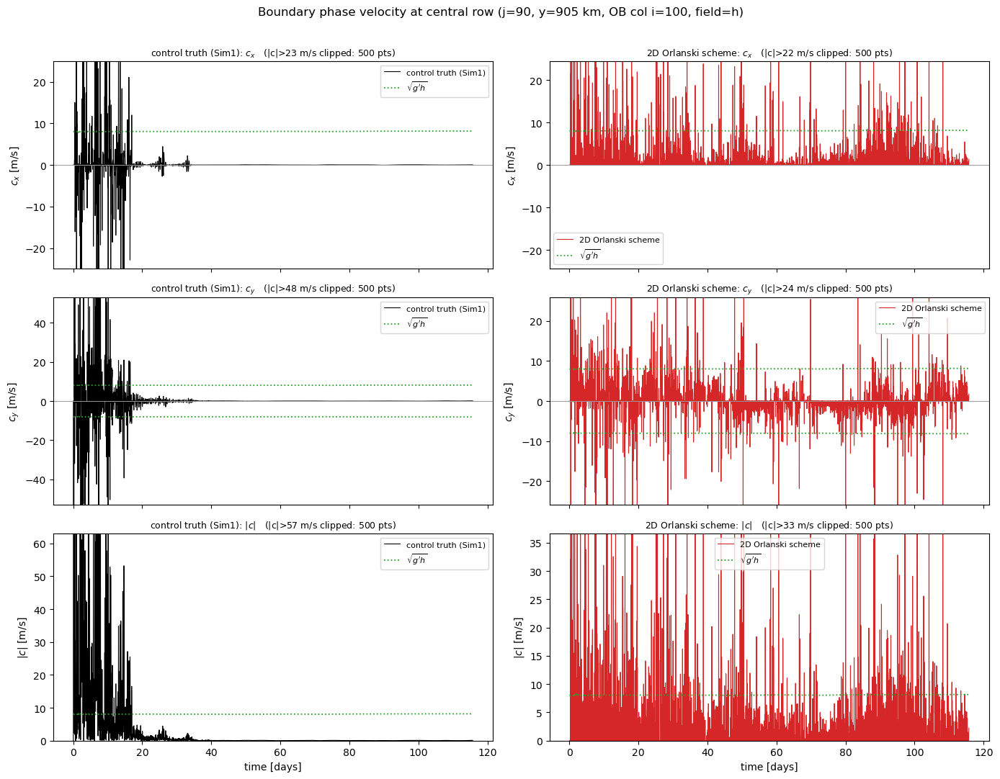

In [34]:
# [OBC - 2D - PhaseDiag] Control and 2D-scheme phase velocity in SEPARATE panels (NOT overlaid).
# rows = (c_x, c_y, |c|) ; cols = (control truth Sim1, 2D Orlanski scheme). Analytic sqrt(g'h) overlaid as reference.

def _dec(t, *ys):
    s = max(1, len(t) // 4000)
    return (t[::s],) + tuple(y[::s] for y in ys)

yloc = (M.yq1 if FIELD == 'v' else M.yh1)[jc] / 1e3

# [OBC - 2D - PhaseDiag - mag] speed magnitude |c| = sqrt(cx^2 + cy^2) per run
cmag_ctl = np.hypot(cx_ctl, cy_ctl)                                   # [OBC] control |c|
cmag_sch = np.hypot(cx_sch, cy_sch)                                   # [OBC] scheme  |c|

runs  = [('control truth (Sim1)', 'k-',  t_ctl, cx_ctl, cy_ctl, cmag_ctl),   # [OBC] +|c|
         ('2D Orlanski scheme',   'C3-', t_sch, cx_sch, cy_sch, cmag_sch)]    # [OBC] +|c|
comps = [('x', 0), ('y', 1), ('mag', 2)]                                     # [OBC] +mag row

fig, ax = plt.subplots(3, 2, figsize=(14, 11), sharex=True)                   # [OBC] 3 rows now
for ccol, (label, sty, tt, cx, cy, cmag) in enumerate(runs):                  # [OBC] unpack cmag
    cvals_by_row = (cx, cy, cmag)                                             # [OBC] map rows->signals
    for (comp, crow), cvals in zip(comps, cvals_by_row):
        a = ax[crow, ccol]
        td, cd = _dec(tt, cvals);  a.plot(td, cd, sty, lw=0.8, label=label)
        ta, ca = _dec(t_an, cg_an); a.plot(ta, ca, 'C2:', lw=1.3, label=r"$\sqrt{g'h}$")
        if comp == 'y': a.plot(ta, -ca, 'C2:', lw=1.3)                        # [OBC] mag: only +sqrt(g'h)
        a.axhline(0, color='0.6', lw=0.7)
        # robust y-limits: clip rare early spikes so the late-time signal is visible
        p = max(np.nanpercentile(np.abs(cvals), 99.0), np.nanmax(ca) * 1.5)
        a.set_ylim((0, 1.1 * p) if comp == 'mag' else (-1.1 * p, 1.1 * p))    # [OBC] mag is nonneg
        nclip = int(np.sum(np.abs(cvals) > p))
        clab = '|c|' if comp == 'mag' else fr'c_{comp}'                       # [OBC] label for mag
        a.set_ylabel(fr'${clab}$ [m/s]'); a.legend(fontsize=8)
        a.set_title(fr'{label}: ${clab}$   (|c|>{p:.0f} m/s clipped: {nclip} pts)', fontsize=9)
ax[2, 0].set_xlabel('time [days]'); ax[2, 1].set_xlabel('time [days]')        # [OBC] xlabel on last row
fig.suptitle(f'Boundary phase velocity at central row (j={jc}, y={yloc:.0f} km, OB col i={int(b_obc)}, field={FIELD})')
fig.tight_layout(rect=(0, 0, 1, 0.97))

# ---- quantitative answer: does the control persist late, or just go small? ----
def _stats(name, t, c):
    late = np.abs(c[t > 50.0])
    lm   = np.nanmean(late) if late.size else float('nan')   # guard short runs
    nz   = np.mean(np.abs(c) > 1e-6) * 100.0          # % of steps with nonzero (outflow) phase speed
    print(f'  {name:8s}: n={c.size}  span={t[0]:.2f}..{t[-1]:.1f} d  '
          f'|c| mean={np.nanmean(np.abs(c)):.2f}  max={np.nanmax(np.abs(c)):.1f}  '
          f'(t>50d) mean={lm:.2f}  nonzero={nz:.0f}%')
print(f'[PhaseDiag] field={FIELD}  j={jc}')
_stats('ctl c_x', t_ctl, cx_ctl); _stats('ctl c_y', t_ctl, cy_ctl); _stats('ctl |c|', t_ctl, cmag_ctl)   # [OBC] +|c|
_stats('sch c_x', t_sch, cx_sch); _stats('sch c_y', t_sch, cy_sch); _stats('sch |c|', t_sch, cmag_sch)   # [OBC] +|c|

[OrlanskiInternals] field=h j=90: denom min=0.000e+00 median=2.785e+00 max=4.413e+02  (==0): 0.0%  (<1e-12): 0.1%


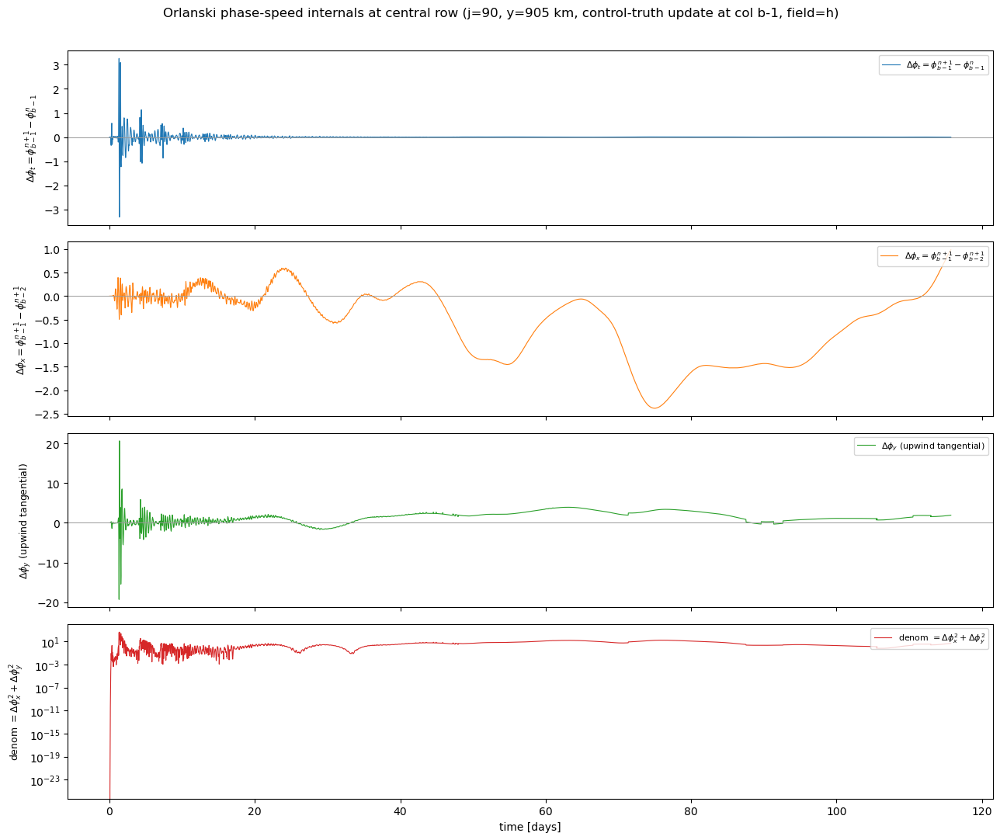

In [35]:
quants = [(r'$\Delta\phi_t = \phi^{n+1}_{b-1}-\phi^{n}_{b-1}$', dphi_t[:, jc], 'C0-'),   # [OBC] time difference
          (r'$\Delta\phi_x = \phi^{n+1}_{b-1}-\phi^{n+1}_{b-2}$', dphi_x[:, jc], 'C1-'), # [OBC] normal-x difference
          (r'$\Delta\phi_y$ (upwind tangential)',                 dphi_y[:, jc], 'C2-'), # [OBC] tangential-y difference
          (r'denom $=\Delta\phi_x^2+\Delta\phi_y^2$',             denom[:, jc],  'C3-')] # [OBC] denominator

t_int = t_ctl                                                    # [OBC] same step axis as cx_ctl/cy_ctl (b-1 update)

fig, ax = plt.subplots(4, 1, figsize=(13, 11), sharex=True)      # [OBC] one panel per quantity
for a, (lab, q, sty) in zip(ax, quants):                         # [OBC]
    td, qd = _dec(t_int, q)                                      # [OBC] reuse decimator from PhaseDiag cell
    a.plot(td, qd, sty, lw=0.8, label=lab)                       # [OBC]
    a.axhline(0, color='0.6', lw=0.7)                            # [OBC]
    a.set_ylabel(lab, fontsize=9); a.legend(fontsize=8, loc='upper right')  # [OBC]
ax[3].set_yscale('log')                                          # [OBC] denom >=0, spans orders of magnitude
ax[3].set_xlabel('time [days]')                                  # [OBC]
fig.suptitle(f'Orlanski phase-speed internals at central row '  # [OBC]
             f'(j={jc}, y={yloc:.0f} km, control-truth update at col b-1, field={FIELD})')  # [OBC]
fig.tight_layout(rect=(0, 0, 1, 0.97))                           # [OBC]

# [OBC] how often does the denominator get near zero (the branch flips that make the stripe noise)?
dz = denom[:, jc]                                                # [OBC]
print(f'[OrlanskiInternals] field={FIELD} j={jc}: '             # [OBC]
      f'denom min={np.nanmin(dz):.3e} median={np.nanmedian(dz):.3e} max={np.nanmax(dz):.3e}  '  # [OBC]
      f'(==0): {np.mean(dz==0.0)*100:.1f}%  (<1e-12): {np.mean(dz<1e-12)*100:.1f}%')             # [OBC]